# Stable Diffusion with Huggingface Diffusers

In [ ]:
 !pip install -Uq diffusers transformers fastcore

## Using Stable Diffusion

In [ ]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

### Stable Diffusion Pipeline

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", variant="fp16", torch_dtype=torch.float16).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

The weights are cached in your home directory by default.

In [ ]:
!ls ~/.cache/huggingface/hub

models--CompVis--stable-diffusion-v1-4	models--pcuenq--jh_dreambooth_1000

models--google--ddpm-celebahq-256	models--runwayml--stable-diffusion-v1-5

models--google--ddpm-church-256


We are now ready to use the pipeline to start creating images.

In [ ]:
#pipe.enable_attention_slicing()

In [ ]:
prompt = "a photograph of an astronaut riding a horse"

  0%|          | 0/51 [00:00<?, ?it/s]

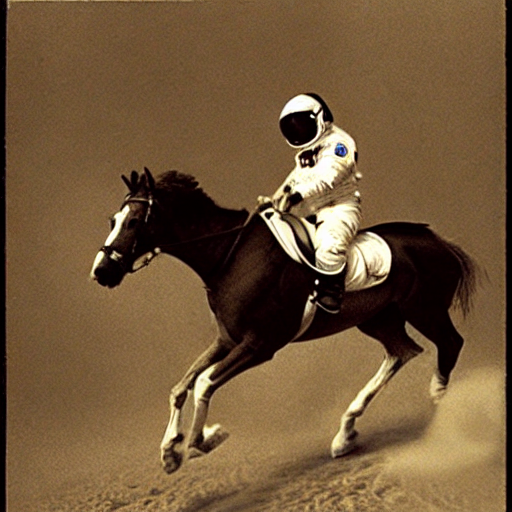

In [ ]:
pipe(prompt).images[0]

  0%|          | 0/51 [00:00<?, ?it/s]

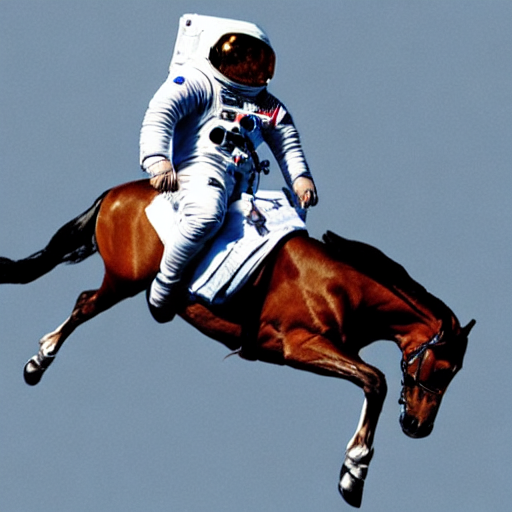

In [ ]:
torch.manual_seed(1024)
pipe(prompt).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

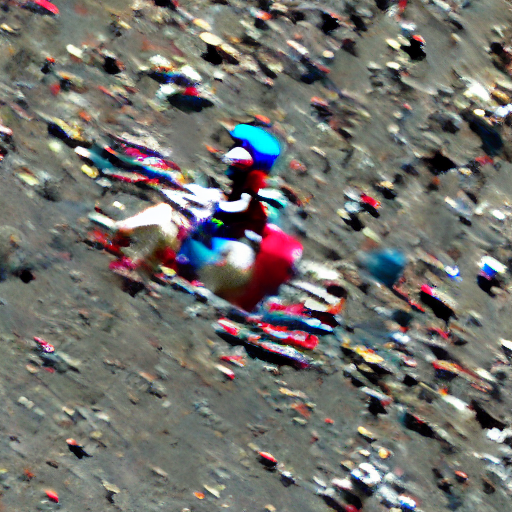

In [ ]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=3).images[0]

  0%|          | 0/17 [00:00<?, ?it/s]

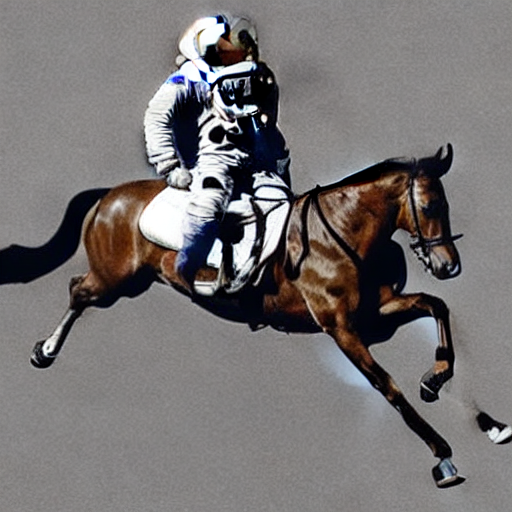

In [ ]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=16).images[0]

### Classifier-Free Guidance

In [ ]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

 Method to increase the adherence of the output to the conditioning signal we used (the text).

Roughly speaking, the larger the guidance the more the model tries to represent the text prompt. However, large values tend to produce less diversity. The default is `7.5`. This [blog post](https://benanne.github.io/2022/05/26/guidance.html) goes into deeper details on how it works.



In [ ]:
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols

In [ ]:
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1,3,7,14])

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

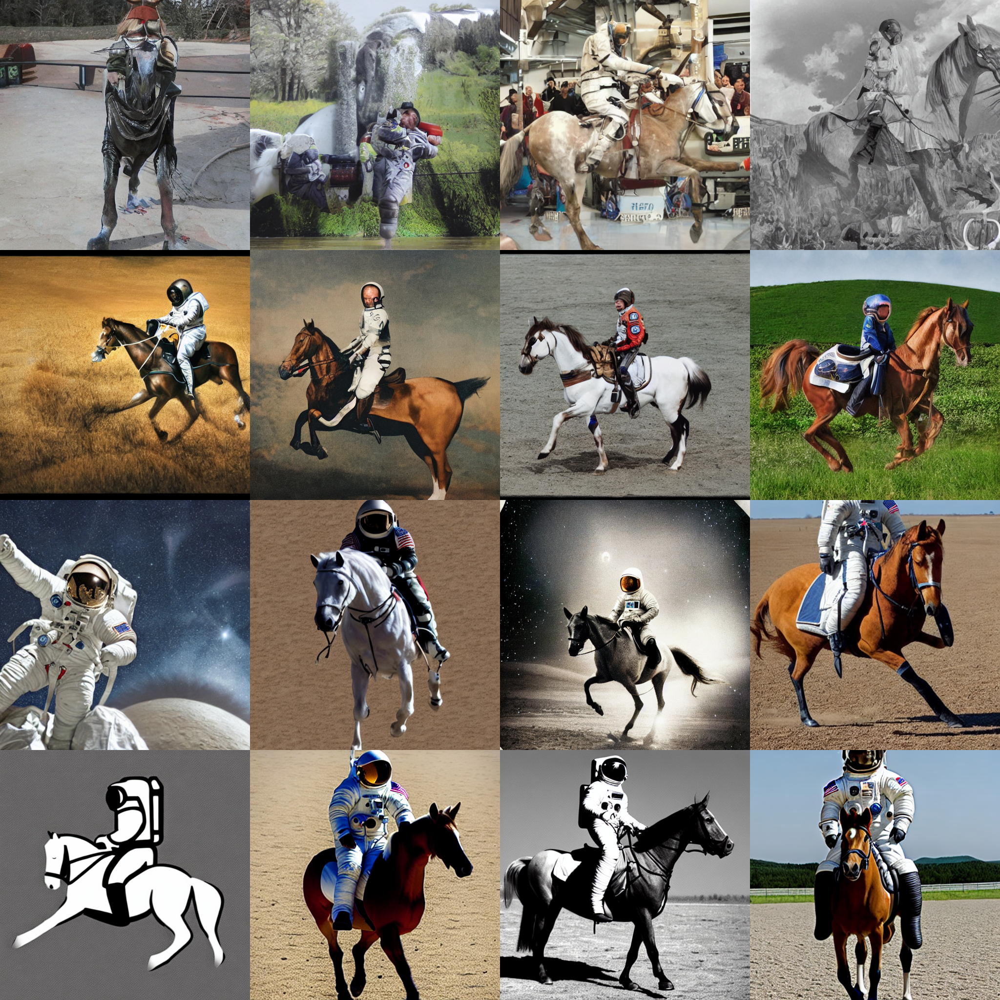

In [ ]:
image_grid(images, rows=num_rows, cols=num_cols)

### Negative prompts

In [ ]:
torch.manual_seed(1000)
prompt = "Labrador in the style of Van Gogh"
pipe(prompt).images[0]

In [ ]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt="blue").images[0]

### Image to Image

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [ ]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    variant="fp16",
    torch_dtype=torch.float16,
).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

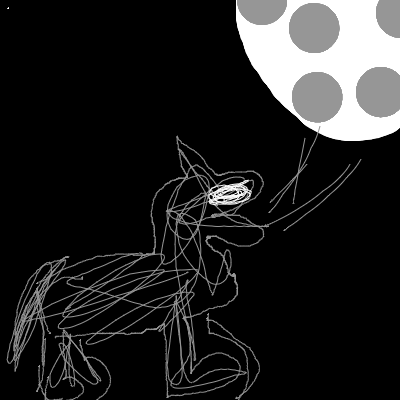

In [ ]:
p = FastDownload().download('https://cdn-uploads.huggingface.co/production/uploads/1664665907257-noauth.png')
init_image = Image.open(p).convert("RGB")
init_image

  0%|          | 0/41 [00:00<?, ?it/s]

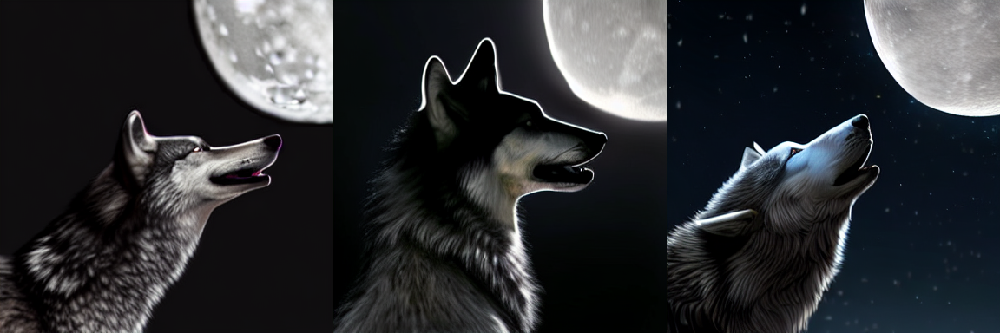

In [ ]:
torch.manual_seed(1000)
prompt = "Wolf howling at the moon, photorealistic 4K"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=0.8, num_inference_steps=50).images
image_grid(images, rows=1, cols=3)

In [ ]:
init_image = images[2]

  0%|          | 0/70 [00:00<?, ?it/s]

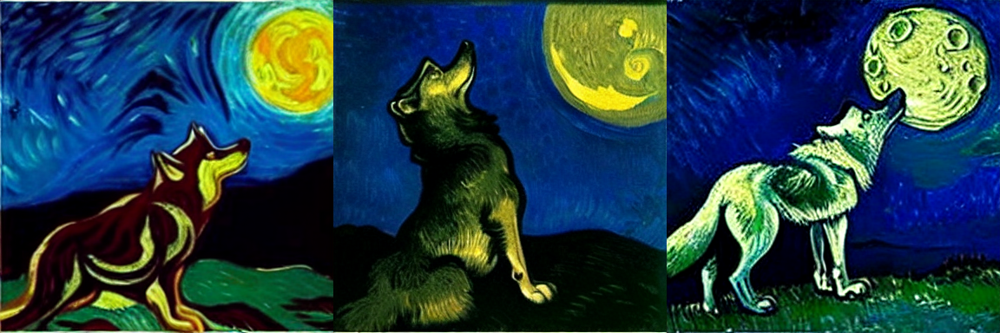

In [ ]:
torch.manual_seed(1000)
prompt = "Oil painting of wolf howling at the moon by Van Gogh"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3)

---

In [ ]:
from IPython.display import display